In [6]:
import geopandas as gpd
import pandas as pd

# Load election data
data_dir = "../data/"
election_data = pd.read_csv(data_dir + "G20192-Columnes-ME.csv", sep=';')

# Load GeoJSON file
map_catalonia='province_map.geojson'
geo_data = gpd.read_file(data_dir + map_catalonia)

# Translate
#election_data.rename(columns={'Nom Municipi': 'municipality'}, inplace=True)
election_data

,﻿Codi Província,Nom Província,Codi Vegueria,Nom Vegueria,Codi Comarca,Nom Comarca,Codi Municipi,Nom Municipi,Districte,Secció,...,VOX Vots,Cs Vots,PACMA Vots,MÁS PAÍS Vots,RECORTES CERO-GV Vots,I.Fem Vots,PUM+J Vots,PCTC Vots,PCPC Vots,IZQP Vots
0,25,Lleida,5,Alt Pirineu i territori d'Aran,25.0,Pallars Jussà,25001,Abella de la Conca,1,1,...,0,2,0,NaN,0,NaN,0,0,0,0
1,8,Barcelona,1,Barcelona,11.0,Baix Llobregat,8001,Abrera,1,1,...,12,14,1,3.0,2,1.0,1,0,0,0
2,8,Barcelona,1,Barcelona,11.0,Baix Llobregat,8001,Abrera,1,1,...,22,25,2,6.0,2,0.0,0,0,0,1
3,8,Barcelona,1,Barcelona,11.0,Baix Llobregat,8001,Abrera,1,1,...,32,26,6,11.0,0,0.0,1,0,0,0
4,8,Barcelona,1,Barcelona,11.0,Baix Llobregat,8001,Abrera,1,2,...,19,13,6,5.0,0,0.0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8364,43,Tarragona,7,Terres de l'Ebre,9.0,Baix Ebre,43052,Xerta,1,1,...,9,3,3,NaN,1,NaN,1,0,0,0
8365,8,Barcelona,98,Residents Absents,NaN,NaN,8998,Residents Absents,1,1,...,785,1262,220,278.0,122,37.0,46,8,19,19
8366,17,Girona,98,Residents Absents,NaN,NaN,17998,Residents Absents,1,1,...,71,105,23,NaN,11,NaN,4,2,1,2
8367,25,Lleida,98,Residents Absents,NaN,NaN,25998,Residents Absents,1,1,...,54,76,25,NaN,5,NaN,4,4,2,0


In [8]:
geo_data.rename(columns={'nomprov': 'province'}, inplace=True)
geo_data_sorted=geo_data.sort_values(by='province')

In [11]:
election_data.rename(columns={'Nom Província': 'province'}, inplace=True)
election_data_sorted=election_data.sort_values(by='province')

In [23]:
election_data_sorted

,﻿Codi Província,province,Codi Vegueria,Nom Vegueria,Codi Comarca,Nom Comarca,Codi Municipi,Nom Municipi,Districte,Secció,...,VOX Vots,Cs Vots,PACMA Vots,MÁS PAÍS Vots,RECORTES CERO-GV Vots,I.Fem Vots,PUM+J Vots,PCTC Vots,PCPC Vots,IZQP Vots
4184,8,Barcelona,1,Barcelona,21.0,Maresme,8110,Malgrat de Mar,2,3,...,26,17,2,3.0,2,0.0,0,0,0,0
4463,8,Barcelona,1,Barcelona,21.0,Maresme,8121,Mataró,4,9,...,55,38,9,8.0,1,0.0,0,0,0,0
4462,8,Barcelona,1,Barcelona,21.0,Maresme,8121,Mataró,4,9,...,58,50,8,10.0,0,2.0,1,0,0,0
4461,8,Barcelona,1,Barcelona,21.0,Maresme,8121,Mataró,4,8,...,65,77,10,7.0,0,0.0,1,0,0,0
4460,8,Barcelona,1,Barcelona,21.0,Maresme,8121,Mataró,4,7,...,103,73,6,8.0,0,2.0,0,2,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3540,43,Tarragona,7,Terres de l'Ebre,37.0,Terra Alta,43071,Horta de Sant Joan,1,1,...,9,9,0,NaN,0,NaN,0,0,0,0
5398,43,Tarragona,6,Camp de Tarragona,8.0,Baix Camp,43123,Reus,6,12,...,27,21,1,NaN,0,NaN,0,0,2,0
5399,43,Tarragona,6,Camp de Tarragona,8.0,Baix Camp,43123,Reus,6,13,...,16,17,1,NaN,0,NaN,1,0,1,1
2988,43,Tarragona,8,Penedès,12.0,Baix Penedès,43051,Cunit,1,2,...,41,37,8,NaN,2,NaN,0,1,0,0


In [42]:
parties = election_data_sorted.columns[21:]

In [43]:
election_data_sorted.groupby(['province'])[parties].sum().reset_index()


,province,ERC-SOBIRANISTES Vots,PSC Vots,ECP-GUANYEM EL CANVI Vots,JxCAT-JUNTS Vots,PP Vots,CUP-PR Vots,VOX Vots,Cs Vots,PACMA Vots,MÁS PAÍS Vots,RECORTES CERO-GV Vots,I.Fem Vots,PUM+J Vots,PCTC Vots,PCPC Vots,IZQP Vots
0,Barcelona,618909,638319,452482,343931,225645,179041,184715,174124,34752,41826.0,4698,3005.0,1577,1587,1509,1178
1,Girona,91932,52723,33710,88060,17449,31703,18489,13869,3724,0.0,508,0.0,339,316,327,246
2,Lleida,65236,29983,16337,46773,14697,14098,9312,7128,1521,0.0,183,0.0,169,126,129,124
3,Tarragona,98782,73641,46644,51461,29923,22129,31124,22814,4588,0.0,533,0.0,351,191,180,343


In [30]:
votes_by_province_grouped = election_data_sorted.groupby(election_data_sorted["province"]).sum()
votes_by_province_grouped

,ERC-SOBIRANISTES Vots,PSC Vots,ECP-GUANYEM EL CANVI Vots,JxCAT-JUNTS Vots,PP Vots,CUP-PR Vots,VOX Vots,Cs Vots,PACMA Vots,MÁS PAÍS Vots,RECORTES CERO-GV Vots,I.Fem Vots,PUM+J Vots,PCTC Vots,PCPC Vots,IZQP Vots
province,,,,,,,,,,,,,,,,
Barcelona,618909,638319,452482,343931,225645,179041,184715,174124,34752,41826.0,4698,3005.0,1577,1587,1509,1178
Girona,91932,52723,33710,88060,17449,31703,18489,13869,3724,0.0,508,0.0,339,316,327,246
Lleida,65236,29983,16337,46773,14697,14098,9312,7128,1521,0.0,183,0.0,169,126,129,124
Tarragona,98782,73641,46644,51461,29923,22129,31124,22814,4588,0.0,533,0.0,351,191,180,343


In [18]:
winner_by_province=votes_by_province.idxmax(axis=1)
list_winners=list(winner_by_province)
votes_by_province['winner']=list_winners
votes_by_province
votes_by_province.sort_values(by='province')

,ERC-SOBIRANISTES Vots,PSC Vots,ECP-GUANYEM EL CANVI Vots,JxCAT-JUNTS Vots,PP Vots,CUP-PR Vots,VOX Vots,Cs Vots,PACMA Vots,MÁS PAÍS Vots,RECORTES CERO-GV Vots,I.Fem Vots,PUM+J Vots,PCTC Vots,PCPC Vots,IZQP Vots,winner
province,,,,,,,,,,,,,,,,,
Barcelona,618909,638319,452482,343931,225645,179041,184715,174124,34752,41826.0,4698,3005.0,1577,1587,1509,1178,PSC Vots
Girona,91932,52723,33710,88060,17449,31703,18489,13869,3724,0.0,508,0.0,339,316,327,246,ERC-SOBIRANISTES Vots
Lleida,65236,29983,16337,46773,14697,14098,9312,7128,1521,0.0,183,0.0,169,126,129,124,ERC-SOBIRANISTES Vots
Tarragona,98782,73641,46644,51461,29923,22129,31124,22814,4588,0.0,533,0.0,351,191,180,343,ERC-SOBIRANISTES Vots


In [19]:
merged_data = geo_data_sorted.merge(votes_by_province, on='province')
merged_data

,codiprov,province,capprov,areap5000,geometry,ERC-SOBIRANISTES Vots,PSC Vots,ECP-GUANYEM EL CANVI Vots,JxCAT-JUNTS Vots,PP Vots,...,Cs Vots,PACMA Vots,MÁS PAÍS Vots,RECORTES CERO-GV Vots,I.Fem Vots,PUM+J Vots,PCTC Vots,PCPC Vots,IZQP Vots,winner
0,08,Barcelona,Barcelona,7730.4124,"MULTIPOLYGON (((1.65111 41.19431, 1.65103 41.1...",618909,638319,452482,343931,225645,...,174124,34752,41826.0,4698,3005.0,1577,1587,1509,1178,PSC Vots
1,17,Girona,Girona,5902.2156,"MULTIPOLYGON (((2.79206 41.66997, 2.79204 41.6...",91932,52723,33710,88060,17449,...,13869,3724,0.0,508,0.0,339,316,327,246,ERC-SOBIRANISTES Vots
2,25,Lleida,Lleida,12165.6897,"MULTIPOLYGON (((1.71468 41.89188, 1.71471 41.8...",65236,29983,16337,46773,14697,...,7128,1521,0.0,183,0.0,169,126,129,124,ERC-SOBIRANISTES Vots
3,43,Tarragona,Tarragona,6305.6772,"MULTIPOLYGON (((0.64478 40.57413, 0.64477 40.5...",98782,73641,46644,51461,29923,...,22814,4588,0.0,533,0.0,351,191,180,343,ERC-SOBIRANISTES Vots


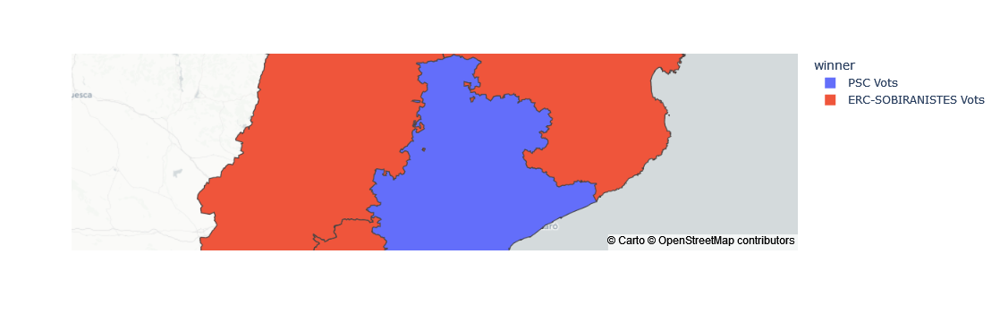

In [21]:
import plotly.express as px

fig = px.choropleth_mapbox(
    merged_data,
    geojson=merged_data.geometry,
    locations=merged_data.index,
    color='winner',  # Change to the column you want to visualize
    hover_name='province',
    mapbox_style="carto-positron",
    center={"lat": 41.8781, "lon": 1.7834},  # Center of Catalonia
    zoom=7
)

fig.update_geos(fitbounds="locations", visible=False)

fig.show()